# Roget's Thesaurus (Embedding's prediction)

> Konstantinos Mpouros <br>
> Github: https://github.com/konstantinosmpouros <br>
> Year: 2024 <br>

## 1. About the notebook
---

> The purpose of this notebook is to performe a part of the hole project (<b>Roget's Thesaurus in the 21st Century</b>) which is the class prediction of the embeddings we created in notebook <b>Roget's Data and Embeddings</b>

>This Jupyter Notebook is focused on the application of machine learning models to predict the categories of word embeddings previously generated from textual data extracted from Gutenberg's website.

## 2. Libraries
---

In [1]:
# Data Loading and Manipulation
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_rank

# Data Normalization, Metrics and Dimensionality reduction
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.decomposition import PCA

# Classification Models and Ensemble Models
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

# Model validation and Hyperparameter tuning
from sklearn.model_selection import cross_val_score
import optuna

# Save the model
from joblib import dump

In [2]:
import warnings
warnings.filterwarnings('ignore')

## 3. Data loading and Preparation

> Load the data and insert in each one the appropriate columns for the prediction. In our case the roget's class.

In [3]:
roget_words = pd.read_csv("Words/Roget's_Words.csv")
print(roget_words.shape)
roget_words.head()

(88353, 6)


,Class,Division,Primary_Section,Sub_Section,Word,Section
0,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",existence,SECTION I. EXISTENCE
1,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",being,SECTION I. EXISTENCE
2,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",entity,SECTION I. EXISTENCE
3,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",subsistence,SECTION I. EXISTENCE
4,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"BEING, IN THE ABSTRACT",reality,SECTION I. EXISTENCE


In [4]:
sentence_tranformer_embeddings = pd.read_json('Embeddings/sentence_tranformer_embeddings.json')
print(sentence_tranformer_embeddings.shape)
sentence_tranformer_embeddings.head()

(88353, 1)


,Embeddings
0,"[-0.06880877170000001, 0.0015575370000000001, ..."
1,"[0.0024004122000000003, 0.020551782100000002, ..."
2,"[-0.0097784037, -3.9502e-05, -0.01282439660000..."
3,"[-0.012498525, 0.0810882673, -0.0504169427, 0...."
4,"[-0.0132661257, 0.0121876495, -0.0619583502000..."


In [5]:
sentence_tranformer_embeddings = pd.merge(sentence_tranformer_embeddings,
                                          roget_words['Class'],
                                          left_index=True,
                                          right_index=True,
                                          how='outer'
                                          )
sentence_tranformer_embeddings

,Embeddings,Class
0,"[-0.06880877170000001, 0.0015575370000000001, ...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS
1,"[0.0024004122000000003, 0.020551782100000002, ...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS
2,"[-0.0097784037, -3.9502e-05, -0.01282439660000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS
3,"[-0.012498525, 0.0810882673, -0.0504169427, 0....",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS
4,"[-0.0132661257, 0.0121876495, -0.0619583502000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS
...,...,...
88348,"[0.0255490765, 0.0240662042, -0.0762141049, -0...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...
88349,"[0.0169134196, -0.0647304654, -0.0094027240000...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...
88350,"[0.073002696, -0.024290988200000002, -0.079109...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...
88351,"[0.0125833051, 0.0338308141, -0.01210350360000...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...


In [6]:
use_embeddings = pd.read_json('Embeddings/universal_sentence_encoder_embeddings.json')
print(use_embeddings.shape)
use_embeddings.head()

(88353, 1)


,Embeddings
0,"[-0.0396379605, -0.042999919500000004, -0.0274..."
1,"[-0.0382796377, -0.0570409745, 0.0563224480000..."
2,"[-0.040613506, 0.013880508000000001, -0.027027..."
3,"[-0.0177038833, -0.0793429762, -0.018696246700..."
4,"[-0.0404398814, 0.007750398, -0.0485983714, 0...."


In [7]:
use_embeddings = pd.merge(use_embeddings,
                          roget_words['Class'],
                          left_index=True,
                          right_index=True,
                          how='outer'
                          )
use_embeddings

,Embeddings,Class
0,"[-0.0396379605, -0.042999919500000004, -0.0274...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS
1,"[-0.0382796377, -0.0570409745, 0.0563224480000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS
2,"[-0.040613506, 0.013880508000000001, -0.027027...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS
3,"[-0.0177038833, -0.0793429762, -0.018696246700...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS
4,"[-0.0404398814, 0.007750398, -0.0485983714, 0....",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS
...,...,...
88348,"[0.0491876565, -0.0453704819, 0.0396645963, -0...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...
88349,"[-0.0353110284, -0.0295349434, 0.0116038844, 0...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...
88350,"[0.0113966716, -0.035985540600000004, 0.031265...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...
88351,"[-0.05716852100000001, 0.027027575300000002, -...",CLASS VI WORDS RELATING TO THE SENTIMENT AND M...


In [8]:
def pca_embeddings(dfs: list):
    for df in dfs:
        pca = PCA(n_components=200, random_state=33)
        df['Embeddings_PCA'] = pd.DataFrame(zip(pca.fit_transform(list(df.Embeddings.values))))


pca_embeddings([use_embeddings, sentence_tranformer_embeddings])

In [9]:
use_embeddings.head()

,Embeddings,Class,Embeddings_PCA
0,"[-0.0396379605, -0.042999919500000004, -0.0274...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,"[-0.06893570901269033, 0.1027777606438289, 0.3..."
1,"[-0.0382796377, -0.0570409745, 0.0563224480000...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,"[-0.1134517124864413, 0.4843799211805438, 0.14..."
2,"[-0.040613506, 0.013880508000000001, -0.027027...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,"[-0.110535074726302, 0.11641461683635962, 0.03..."
3,"[-0.0177038833, -0.0793429762, -0.018696246700...",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,"[-0.12826330545547865, 0.03648888398362177, -0..."
4,"[-0.0404398814, 0.007750398, -0.0485983714, 0....",CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,"[-0.002121062129602822, 0.1310058677790259, 0...."


## 4. Modeling

> The dataset is way too big to use it untuched to train the models and do predictions. We will take a sample of it excactly the 20% of each class. Then we will create the train and test data and we will also scale the X data.

In [10]:
def embeddings_sample(df):
    sampled_df = pd.DataFrame()  # Empty DataFrame to store samples
    for cluster in df.Class.unique():
        cluster_df = df[df['Class'] == cluster]
        sampled_cluster = cluster_df.sample(int(len(cluster_df) / 5), random_state=33)
        sampled_df = pd.concat([sampled_df, sampled_cluster])

    return sampled_df

In [11]:
sample_df = embeddings_sample(use_embeddings)

X = pd.DataFrame(list(sample_df.Embeddings.values))
y_class = sample_df.Class

X_train, X_test, y_class_train, y_class_test = train_test_split(X, y_class, test_size=0.3, random_state=42)

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_scaled = scaler.fit_transform(X)

> The rest 80% of the data that was left behind will be used to check if the models training have gone well and to see if we have overfitting. So we take all the indexes that don't exist in the sample data we took before.

In [12]:
rest_data = use_embeddings.loc[~use_embeddings.index.isin(sample_df.index)]

X_rest = pd.DataFrame(list(rest_data.Embeddings))
X_rest_scaled = scaler.fit_transform(X_rest)

y_class_rest = rest_data.Class

> Initialize a function to automaticly plot a confusion matrix for the data that l will give it from every model and a function to plot the classification report.

In [13]:
def confusion_matrix_plot(y_true, predictions, fig_width=10, fig_height=8, size=10):
    plt.figure(figsize=(fig_width, fig_height))
    
    # Calculate confusion matrix
    cm = confusion_matrix(y_true, predictions)
    
    # Calculate percentage of true positives for each class
    cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100
    
    # Format the percentages to include the '%' sign
    cm_percentage_text = np.array([["{:.2f}%".format(value) for value in row] for row in cm_percentage])
    
    # Use seaborn to create a heatmap with formatted text annotations
    sns.heatmap(cm_percentage, annot=cm_percentage_text, cmap='Blues', fmt='', annot_kws={"size": size}, vmin=0, vmax=100)
    
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix (Percentage of TP per Class)')
    plt.show()

In [14]:
def classification_reporting(y_true, predictions):
    print(classification_report(y_true, predictions))

> We chose 8 different models to use in the class prediction notebook where with all these model we will follow a specific pattern to find the best parameters and optimize the accuracy. The pattern is the following:

> We will first initialize the model without parameters in order to see the score it can hit without any modifiction. The we will use the optuna to modify some of the parameters and find the best combination. If the optuna goes better than the befault then we will take the parameters of the best trial that optuna had and train a model with this parameters in the whole sample data we took. This means we will not train in with the train and score of the test but we will use both of this datasets and score on the rest 80% we left behind.

> The best model that we will save will be the model with the highest score on the rest 80% of the data.

### SGD

In [15]:
sgd = SGDClassifier(random_state=33)
sgd.fit(X_train_scaled, y_class_train)

SGDClassifier(random_state=33)

In [16]:
sgd.score(X_test_scaled, y_class_test)

0.31673269194491604

In [17]:
classification_reporting(y_class_test, sgd.predict(X_test_scaled))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.29      0.25      0.27       827
                         CLASS II WORDS RELATING TO SPACE       0.27      0.31      0.29       707
                       CLASS III WORDS RELATING TO MATTER       0.27      0.25      0.26       528
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.32      0.34      0.33       864
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.36      0.35      0.35      1298
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.34      0.35      0.35      1077

                                                 accuracy                           0.32      5301
                                                macro avg       0.31      0.31      0.31      5301
                                             weighted avg       0.32      0.32      0.32      5301



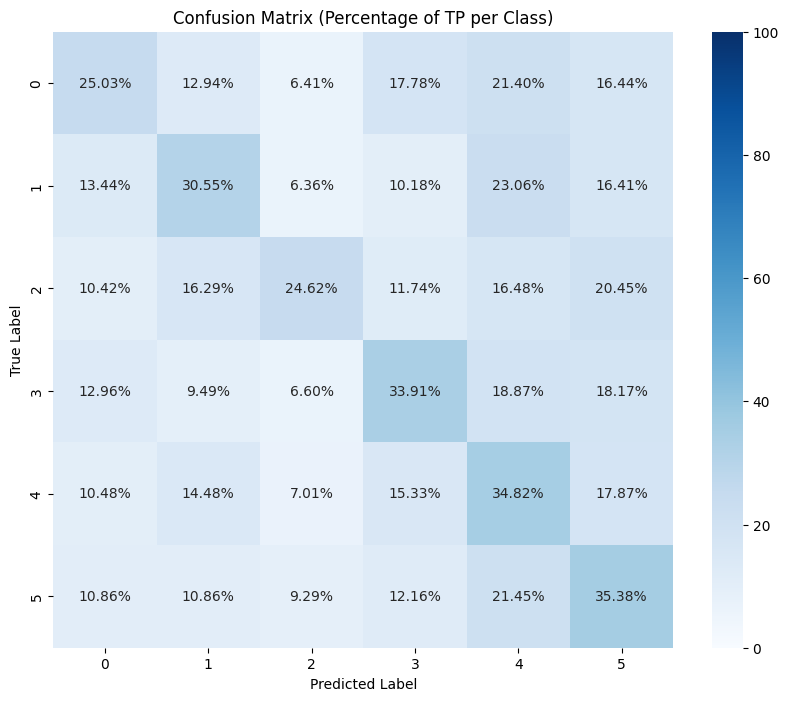

In [18]:
confusion_matrix_plot(y_class_test, sgd.predict(X_test_scaled))

In [19]:
def objective_sgd_class(trial):

    alpha = trial.suggest_float('alpha', 0.01, 1)
    epsilon = trial.suggest_float('epsilon', 0.01, 1)
    l1_ratio = trial.suggest_float('l1_ratio', 0.01, 1)
    penalty = trial.suggest_categorical('penalty', [None, 'l1', 'l2'])
    warm_start = trial.suggest_categorical('warm_start', [True, False])
    
    sgd = SGDClassifier(alpha=alpha,
                         epsilon=epsilon,
                         l1_ratio=l1_ratio,
                         penalty=penalty,
                         warm_start=warm_start,
                         max_iter=50,
                         random_state=33
                         )

    score = cross_val_score(sgd, X_train_scaled, y_class_train, cv=5, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [20]:
study_sgd = optuna.create_study(direction="maximize")
study_sgd.optimize(objective_sgd_class, n_trials=30, n_jobs=-1)

[I 2024-02-22 22:02:28,139] A new study created in memory with name: no-name-30808650-209d-4108-b728-d89bb193ddb3
[I 2024-02-22 22:02:38,475] Trial 1 finished with value: 0.37672829370458844 and parameters: {'alpha': 0.71791048258953, 'epsilon': 0.9687658320796859, 'l1_ratio': 0.49850128897435847, 'penalty': 'l2', 'warm_start': True}. Best is trial 1 with value: 0.37672829370458844.
[I 2024-02-22 22:02:38,815] Trial 0 finished with value: 0.22067117104011932 and parameters: {'alpha': 0.5939557539817457, 'epsilon': 0.9619274200107338, 'l1_ratio': 0.873315658192282, 'penalty': 'l1', 'warm_start': True}. Best is trial 1 with value: 0.37672829370458844.
[I 2024-02-22 22:02:38,981] Trial 5 finished with value: 0.19511941580222425 and parameters: {'alpha': 0.7381625041522132, 'epsilon': 0.8632724394057986, 'l1_ratio': 0.6587357894136288, 'penalty': 'l1', 'warm_start': True}. Best is trial 1 with value: 0.37672829370458844.
[I 2024-02-22 22:02:39,121] Trial 7 finished with value: 0.3751923849

In [21]:
print('Best trial:')
trial = study_sgd.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.38093371222460454
Params: 
  alpha: 0.21272035462508532
  epsilon: 0.3505019787898986
  l1_ratio: 0.5871041586287534
  penalty: l2
  warm_start: False


In [22]:
fig = plot_optimization_history(study_sgd)

fig.update_layout(yaxis_range=[0, 1], title="Stochastic Gradient Descent Optuna's Performance")
fig.show()

In [23]:
fig = plot_param_importances(study_sgd)

fig.update_layout(title="Stochastic Gradient Descent Optuna's Hyperparameter Importance")
fig.show()

In [24]:
fig = plot_rank(study_sgd)
fig.update_layout(title="Stochastic Gradient Descent Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [25]:
sgd_class = SGDClassifier(**trial.params, random_state=33)
sgd_class.fit(X_scaled, y_class)

SGDClassifier(alpha=0.21272035462508532, epsilon=0.3505019787898986,
              l1_ratio=0.5871041586287534, random_state=33)

In [26]:
sgd_class.score(X_rest_scaled, y_class_rest)

0.3833911013652119

In [27]:
classification_reporting(y_class_rest, sgd_class.predict(X_rest_scaled))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.47      0.28      0.35     11070
                         CLASS II WORDS RELATING TO SPACE       0.43      0.21      0.28      9400
                       CLASS III WORDS RELATING TO MATTER       0.42      0.13      0.20      7140
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.51      0.35      0.41     11077
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.35      0.54      0.43     17422
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.34      0.54      0.42     14576

                                                 accuracy                           0.38     70685
                                                macro avg       0.42      0.34      0.35     70685
                                             weighted avg       0.41      0.38      0.37     70685



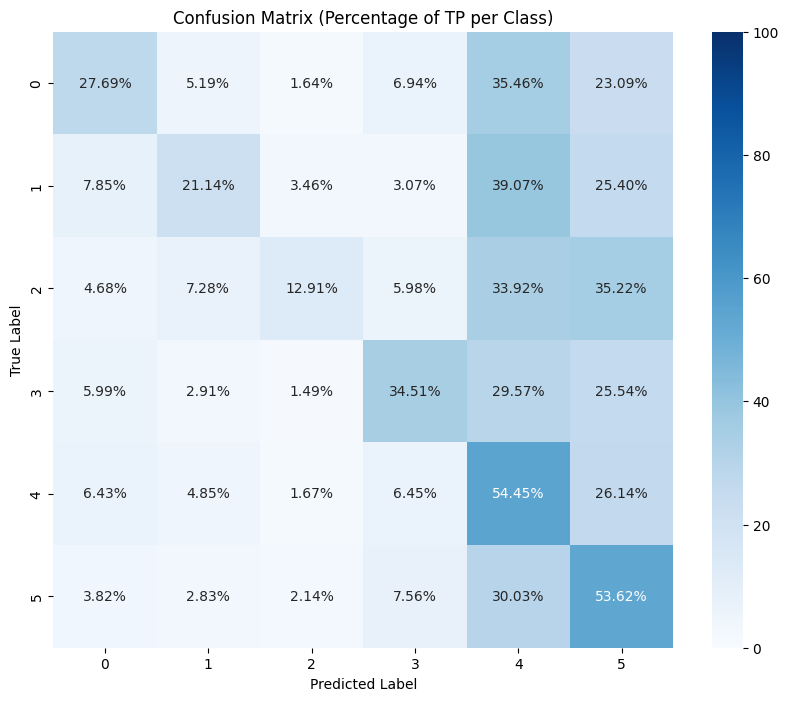

In [28]:
confusion_matrix_plot(y_class_rest, sgd_class.predict(X_rest_scaled))

### SVC

In [29]:
svc = SVC(max_iter=150, random_state=33)
svc.fit(X_train_scaled, y_class_train)

SVC(max_iter=150, random_state=33)

In [30]:
svc.score(X_test_scaled, y_class_test)

0.21844934917940012

In [31]:
classification_reporting(y_class_test, svc.predict(X_test_scaled))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.19      0.48      0.28       827
                         CLASS II WORDS RELATING TO SPACE       0.19      0.26      0.22       707
                       CLASS III WORDS RELATING TO MATTER       0.19      0.23      0.21       528
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.26      0.20      0.23       864
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.32      0.13      0.19      1298
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.25      0.10      0.15      1077

                                                 accuracy                           0.22      5301
                                                macro avg       0.23      0.23      0.21      5301
                                             weighted avg       0.25      0.22      0.21      5301



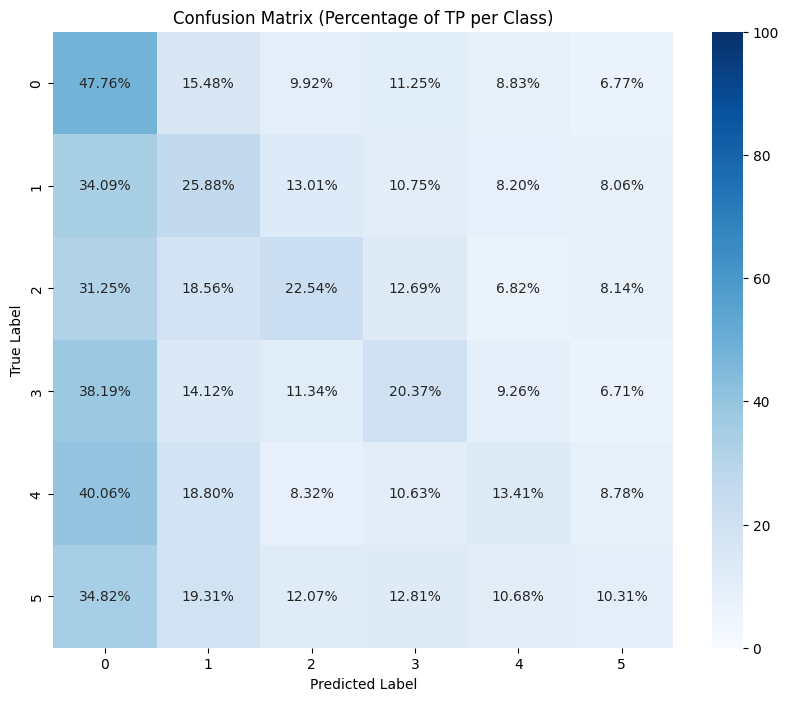

In [32]:
confusion_matrix_plot(y_class_test, svc.predict(X_test_scaled))

In [33]:
def objective_svc_class(trial):
    C = trial.suggest_float('C', 0.01, 1)
    kernel = trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf'])
    gamma = trial.suggest_categorical('gamma', ['scale', 'auto'])
    degree = trial.suggest_int('degree', 2, 6)
    
    svc = SVC(C=C, gamma=gamma, kernel=kernel, degree=degree, max_iter=150, random_state=33)

    score = cross_val_score(svc, X_train_scaled, y_class_train, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [34]:
study_svc = optuna.create_study(direction="maximize")
study_svc.optimize(objective_svc_class, n_trials=20, n_jobs=-1)

[I 2024-02-22 22:03:10,654] A new study created in memory with name: no-name-0519c96e-9773-43b7-a1c9-6f19dea4798c
[I 2024-02-22 22:03:49,888] Trial 1 finished with value: 0.23384795075415948 and parameters: {'C': 0.4438603485343339, 'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}. Best is trial 1 with value: 0.23384795075415948.
[I 2024-02-22 22:03:49,908] Trial 3 finished with value: 0.20789195910824781 and parameters: {'C': 0.6157251127526274, 'kernel': 'poly', 'gamma': 'scale', 'degree': 4}. Best is trial 1 with value: 0.23384795075415948.
[I 2024-02-22 22:03:49,935] Trial 0 finished with value: 0.22560216220386317 and parameters: {'C': 0.8885243590659768, 'kernel': 'rbf', 'gamma': 'scale', 'degree': 3}. Best is trial 1 with value: 0.23384795075415948.
[I 2024-02-22 22:04:23,854] Trial 8 finished with value: 0.20409283642481896 and parameters: {'C': 0.2553769195387492, 'kernel': 'linear', 'gamma': 'scale', 'degree': 6}. Best is trial 1 with value: 0.23384795075415948.
[I 2024-02-22 

In [35]:
print('Best trial:')
trial = study_svc.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.24355125901367755
Params: 
  C: 0.17005235553524134
  kernel: rbf
  gamma: scale
  degree: 4


In [36]:
fig = plot_optimization_history(study_svc)

fig.update_layout(yaxis_range=[0, 1], title="Support Vector Machine Optuna's Performance")
fig.show()

In [37]:
fig = plot_param_importances(study_svc)

fig.update_layout(title="Support Vector Machine Optuna's Hyperparameter Importance")
fig.show()

In [38]:
fig = plot_rank(study_svc)
fig.update_layout(title="Support Vector Machine Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [39]:
svc_class = SVC(**study_svc.best_trial.params, max_iter=150, random_state=33)
svc_class.fit(X_scaled, y_class)

SVC(C=0.17005235553524134, degree=4, max_iter=150, random_state=33)

In [40]:
svc_class.score(X_rest_scaled, y_class_rest)

0.20882789842257904

In [41]:
classification_reporting(y_class_rest, svc_class.predict(X_rest_scaled))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.17      0.56      0.27     11070
                         CLASS II WORDS RELATING TO SPACE       0.17      0.14      0.16      9400
                       CLASS III WORDS RELATING TO MATTER       0.19      0.13      0.15      7140
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.23      0.13      0.16     11077
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.28      0.08      0.13     17422
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.30      0.24      0.27     14576

                                                 accuracy                           0.21     70685
                                                macro avg       0.22      0.21      0.19     70685
                                             weighted avg       0.24      0.21      0.19     70685



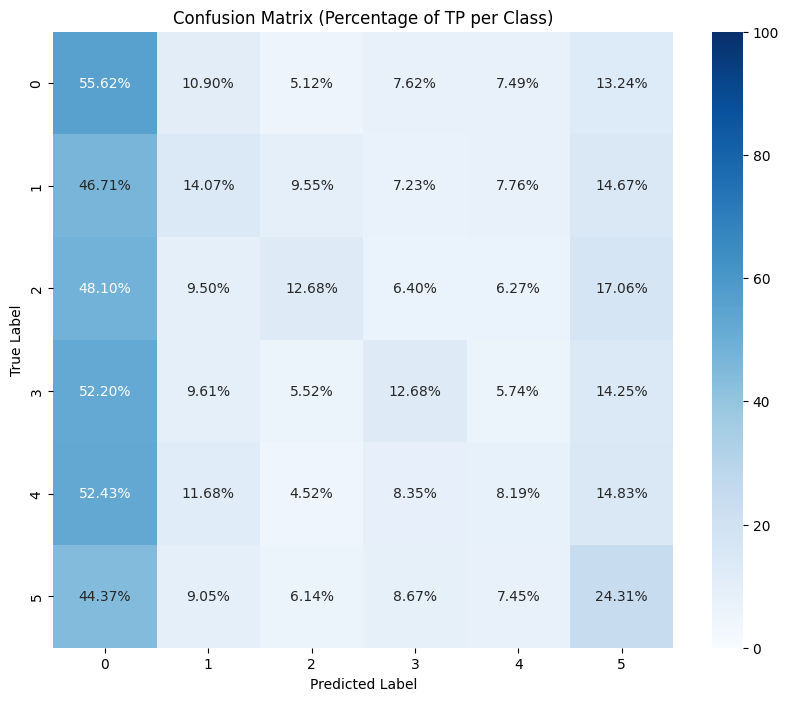

In [42]:
confusion_matrix_plot(y_class_rest, svc_class.predict(X_rest_scaled))

### Random Forest

In [43]:
rf = RandomForestClassifier(random_state=33)
rf.fit(X_train_scaled, y_class_train)

RandomForestClassifier(random_state=33)

In [44]:
rf.score(X_test_scaled, y_class_test)

0.3554046406338427

In [45]:
classification_reporting(y_class_test, rf.predict(X_test_scaled))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.39      0.25      0.30       827
                         CLASS II WORDS RELATING TO SPACE       0.34      0.20      0.25       707
                       CLASS III WORDS RELATING TO MATTER       0.34      0.12      0.18       528
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.47      0.26      0.34       864
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.33      0.59      0.43      1298
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.35      0.44      0.39      1077

                                                 accuracy                           0.36      5301
                                                macro avg       0.37      0.31      0.31      5301
                                             weighted avg       0.37      0.36      0.34      5301



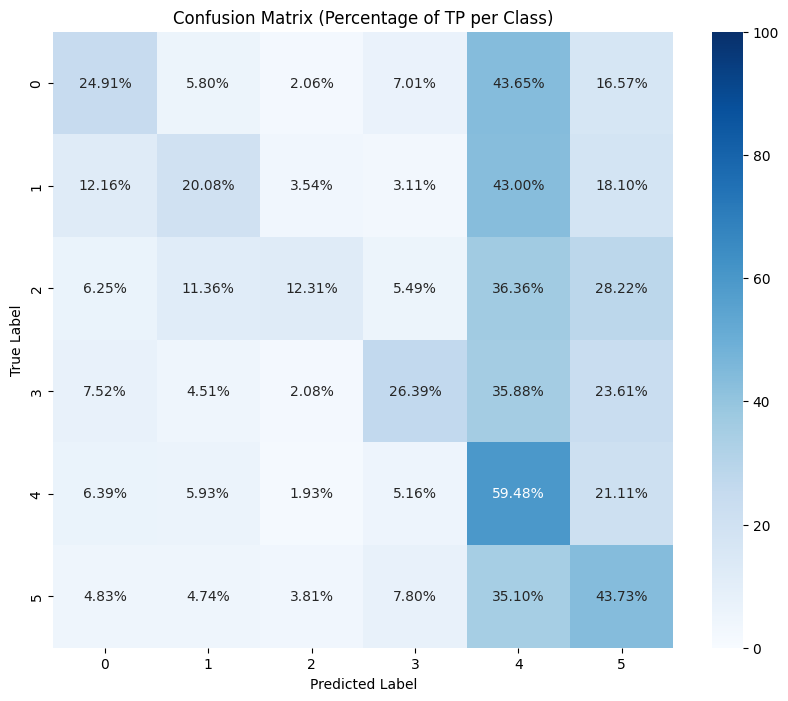

In [46]:
confusion_matrix_plot(y_class_test, rf.predict(X_test_scaled))

In [47]:
def objective_rf_class(trial):

    n_estimators = trial.suggest_int('n_estimators', low=50, high=150, step=50)
    max_depth = trial.suggest_int('max_depth', 1, 30)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 5)
    bootstrap = trial.suggest_categorical('bootstrap', [True, False])
    
    rfc_optuna = RandomForestClassifier(n_estimators=n_estimators,
                                        max_depth=max_depth,
                                        min_samples_split=min_samples_split,
                                        min_samples_leaf=min_samples_leaf,
                                        bootstrap=bootstrap,
                                        n_jobs=-1,
                                        random_state=33,
                                        )

    score = cross_val_score(rfc_optuna, X_train_scaled, y_class_train, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [48]:
study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(objective_rf_class, n_trials=20, n_jobs=-1)

[I 2024-02-22 22:07:06,972] A new study created in memory with name: no-name-c86b2453-07c8-488e-95f9-4f2150ea8a83
[I 2024-02-22 22:07:31,469] Trial 2 finished with value: 0.3669454195856887 and parameters: {'n_estimators': 150, 'max_depth': 22, 'min_samples_split': 3, 'min_samples_leaf': 4, 'bootstrap': True}. Best is trial 2 with value: 0.3669454195856887.
[I 2024-02-22 22:07:47,518] Trial 1 finished with value: 0.35942468064964184 and parameters: {'n_estimators': 50, 'max_depth': 26, 'min_samples_split': 6, 'min_samples_leaf': 3, 'bootstrap': False}. Best is trial 2 with value: 0.3669454195856887.
[I 2024-02-22 22:07:58,618] Trial 0 finished with value: 0.36912815235587193 and parameters: {'n_estimators': 100, 'max_depth': 14, 'min_samples_split': 8, 'min_samples_leaf': 1, 'bootstrap': False}. Best is trial 0 with value: 0.36912815235587193.
[I 2024-02-22 22:08:12,319] Trial 4 finished with value: 0.35716006107676734 and parameters: {'n_estimators': 50, 'max_depth': 10, 'min_samples_

In [49]:
print('Best trial:')
trial = study_rf.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.3756775274827474
Params: 
  n_estimators: 150
  max_depth: 20
  min_samples_split: 2
  min_samples_leaf: 5
  bootstrap: False


In [50]:
fig = plot_optimization_history(study_rf)

fig.update_layout(yaxis_range=[0, 1], title="Random Forest Optuna's Performance")
fig.show()

In [51]:
fig = plot_param_importances(study_rf)

fig.update_layout(title="Random Forest Optuna's Hyperparameter Importance")
fig.show()

In [52]:
fig = plot_rank(study_rf)
fig.update_layout(title="Random Forest Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [53]:
rf_class = RandomForestClassifier(**study_rf.best_trial.params, random_state=33, n_jobs=-1)
rf_class.fit(X_scaled, y_class)

RandomForestClassifier(bootstrap=False, max_depth=20, min_samples_leaf=5,
                       n_estimators=150, n_jobs=-1, random_state=33)

In [54]:
rf_class.score(X_rest_scaled, y_class_rest)

0.3863478814458513

In [55]:
classification_reporting(y_class_rest, rf_class.predict(X_rest_scaled))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.44      0.25      0.31     11070
                         CLASS II WORDS RELATING TO SPACE       0.39      0.23      0.29      9400
                       CLASS III WORDS RELATING TO MATTER       0.43      0.17      0.24      7140
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.51      0.31      0.39     11077
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.35      0.61      0.44     17422
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.38      0.49      0.43     14576

                                                 accuracy                           0.39     70685
                                                macro avg       0.42      0.34      0.35     70685
                                             weighted avg       0.41      0.39      0.37     70685



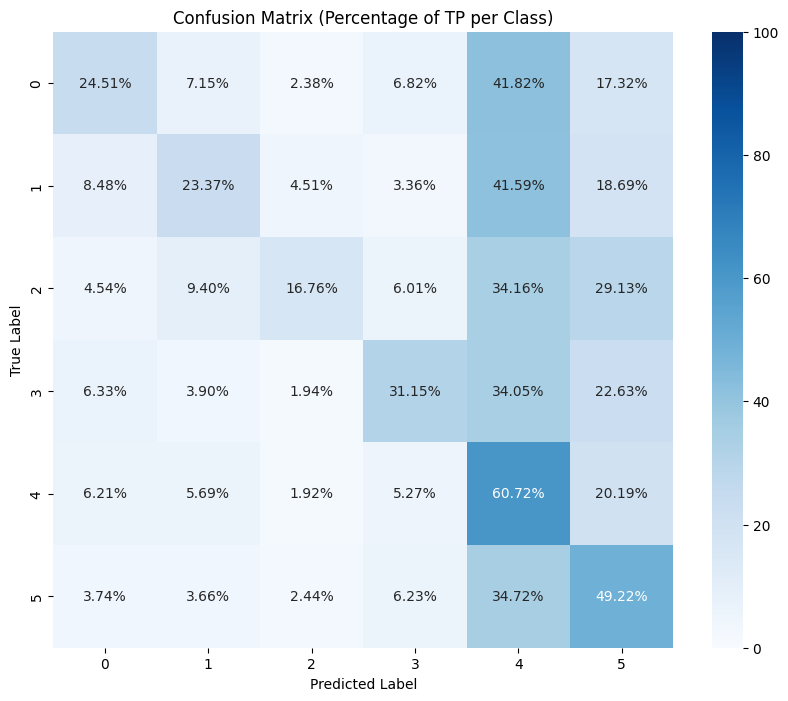

In [56]:
confusion_matrix_plot(y_class_rest, rf_class.predict(X_rest_scaled))

### AdaBoost

In [57]:
adaboost = AdaBoostClassifier(random_state=33)
adaboost.fit(X_train_scaled, y_class_train)

AdaBoostClassifier(random_state=33)

In [58]:
adaboost.score(X_test_scaled, y_class_test)

0.34502923976608185

In [59]:
classification_reporting(y_class_test, adaboost.predict(X_test_scaled))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.35      0.25      0.29       827
                         CLASS II WORDS RELATING TO SPACE       0.31      0.33      0.32       707
                       CLASS III WORDS RELATING TO MATTER       0.27      0.25      0.26       528
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.40      0.35      0.37       864
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.36      0.43      0.39      1298
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.34      0.38      0.36      1077

                                                 accuracy                           0.35      5301
                                                macro avg       0.34      0.33      0.33      5301
                                             weighted avg       0.35      0.35      0.34      5301



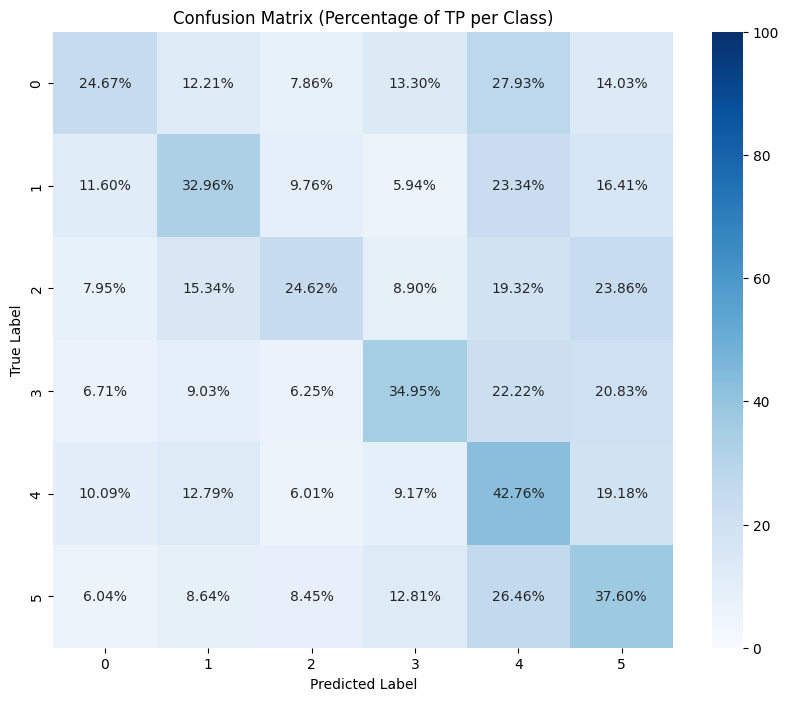

In [60]:
confusion_matrix_plot(y_class_test, adaboost.predict(X_test_scaled))

In [61]:
def objective_ada_class(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 200, step=50),
        # 'learning_rate': trial.suggest_float('learning_rate', .01, .05),
        'random_state': 33
    }
    adaboost = AdaBoostClassifier(**params)
    
    score = cross_val_score(adaboost,
                            X_train_scaled,
                            y_class_train,
                            scoring='accuracy',
                            cv=5,
                            n_jobs=-1)

    return score.mean()

In [62]:
study_adaboost = optuna.create_study(direction='maximize')
study_adaboost.optimize(objective_ada_class, n_trials=10, n_jobs=-1)

[I 2024-02-22 22:10:25,085] A new study created in memory with name: no-name-8ca0d17c-f497-4767-bfbe-bf218c3d4a64
[I 2024-02-22 22:11:02,515] Trial 1 finished with value: 0.34341471563050713 and parameters: {'n_estimators': 50}. Best is trial 1 with value: 0.34341471563050713.
[I 2024-02-22 22:11:02,530] Trial 3 finished with value: 0.34341471563050713 and parameters: {'n_estimators': 50}. Best is trial 1 with value: 0.34341471563050713.
[I 2024-02-22 22:11:39,175] Trial 5 finished with value: 0.34341471563050713 and parameters: {'n_estimators': 50}. Best is trial 1 with value: 0.34341471563050713.
[I 2024-02-22 22:11:39,939] Trial 2 finished with value: 0.34398020856454237 and parameters: {'n_estimators': 100}. Best is trial 2 with value: 0.34398020856454237.
[I 2024-02-22 22:12:53,530] Trial 0 finished with value: 0.34559764453674463 and parameters: {'n_estimators': 150}. Best is trial 0 with value: 0.34559764453674463.
[I 2024-02-22 22:13:30,328] Trial 9 finished with value: 0.34341

In [63]:
print('Best trial:')
trial = study_adaboost.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.34559764453674463
Params: 
  n_estimators: 150


In [64]:
trials_df = study_adaboost.trials_dataframe()
trials_df.sort_values(by='value', ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_n_estimators,state
0,0,0.345598,2024-02-22 22:10:25.085654,2024-02-22 22:12:53.530766,0 days 00:02:28.445112,150,COMPLETE
4,4,0.345598,2024-02-22 22:10:25.103515,2024-02-22 22:14:36.732185,0 days 00:04:11.628670,150,COMPLETE
8,8,0.345598,2024-02-22 22:10:25.127078,2024-02-22 22:15:07.077910,0 days 00:04:41.950832,150,COMPLETE
2,2,0.343980,2024-02-22 22:10:25.092096,2024-02-22 22:11:39.939535,0 days 00:01:14.847439,100,COMPLETE
6,6,0.343980,2024-02-22 22:10:25.111430,2024-02-22 22:14:37.856411,0 days 00:04:12.744981,100,COMPLETE
1,1,0.343415,2024-02-22 22:10:25.092096,2024-02-22 22:11:02.515113,0 days 00:00:37.423017,50,COMPLETE
3,3,0.343415,2024-02-22 22:10:25.099516,2024-02-22 22:11:02.530739,0 days 00:00:37.431223,50,COMPLETE
5,5,0.343415,2024-02-22 22:10:25.106427,2024-02-22 22:11:39.175099,0 days 00:01:14.068672,50,COMPLETE
9,9,0.343415,2024-02-22 22:10:25.127078,2024-02-22 22:13:30.328548,0 days 00:03:05.201470,50,COMPLETE
7,7,0.342687,2024-02-22 22:10:25.111430,2024-02-22 22:15:35.374668,0 days 00:05:10.263238,200,COMPLETE


In [65]:
fig = plot_optimization_history(study_adaboost)
fig.update_layout(yaxis_range=[0, 1], title="AdaBoost Optuna's Performance")
fig.show()

In [66]:
fig = plot_param_importances(study_adaboost)
fig.update_layout(title="AdaBoost Optuna's Hyperparameter Importance")
fig.show()

In [67]:
fig = plot_rank(study_adaboost)
fig.update_layout(title="AdaBoost Optuna's Hyperparams Rank (Objective Value)")
fig.show()

In [68]:
adaboost_class = AdaBoostClassifier(**study_adaboost.best_trial.params)
adaboost_class.fit(X_scaled, y_class)

AdaBoostClassifier(n_estimators=150)

In [69]:
adaboost_class.score(X_test_scaled, y_class_test)

0.3838898321071496

In [70]:
classification_reporting(y_class_test, adaboost_class.predict(X_test_scaled))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.37      0.30      0.33       827
                         CLASS II WORDS RELATING TO SPACE       0.33      0.38      0.35       707
                       CLASS III WORDS RELATING TO MATTER       0.35      0.34      0.34       528
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.42      0.41      0.41       864
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.40      0.45      0.43      1298
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.40      0.37      0.38      1077

                                                 accuracy                           0.38      5301
                                                macro avg       0.38      0.38      0.38      5301
                                             weighted avg       0.38      0.38      0.38      5301



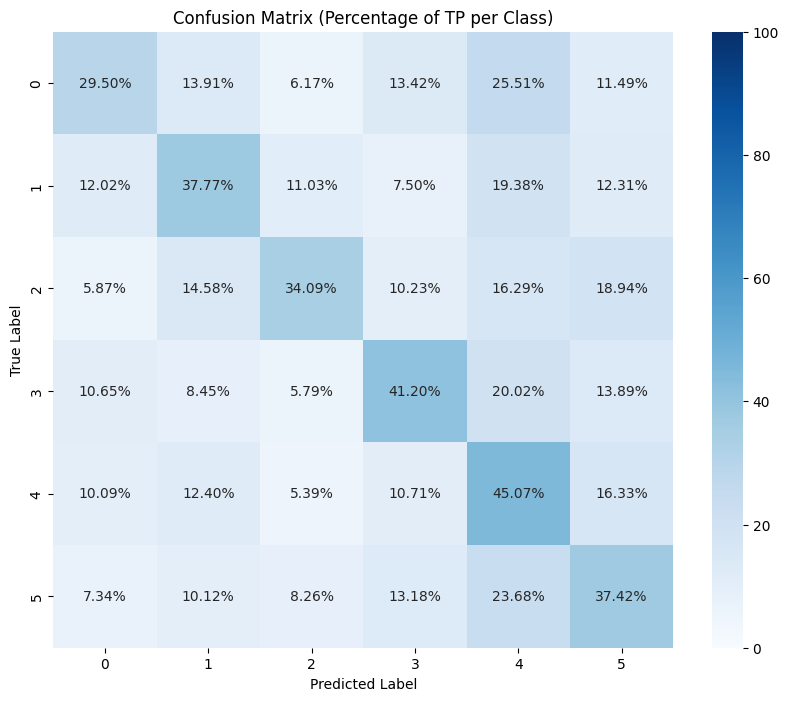

In [71]:
confusion_matrix_plot(y_class_test, adaboost_class.predict(X_test_scaled))

### Extra Trees

In [72]:
etc = ExtraTreesClassifier()
etc.fit(X_train_scaled, y_class_train)

ExtraTreesClassifier()

In [73]:
etc.score(X_test_scaled, y_class_test)

0.3484248255046218

In [74]:
classification_reporting(y_class_test, etc.predict(X_test_scaled))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.38      0.23      0.28       827
                         CLASS II WORDS RELATING TO SPACE       0.34      0.19      0.25       707
                       CLASS III WORDS RELATING TO MATTER       0.32      0.10      0.16       528
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.46      0.27      0.34       864
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.33      0.59      0.42      1298
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.34      0.44      0.38      1077

                                                 accuracy                           0.35      5301
                                                macro avg       0.36      0.30      0.30      5301
                                             weighted avg       0.36      0.35      0.33      5301



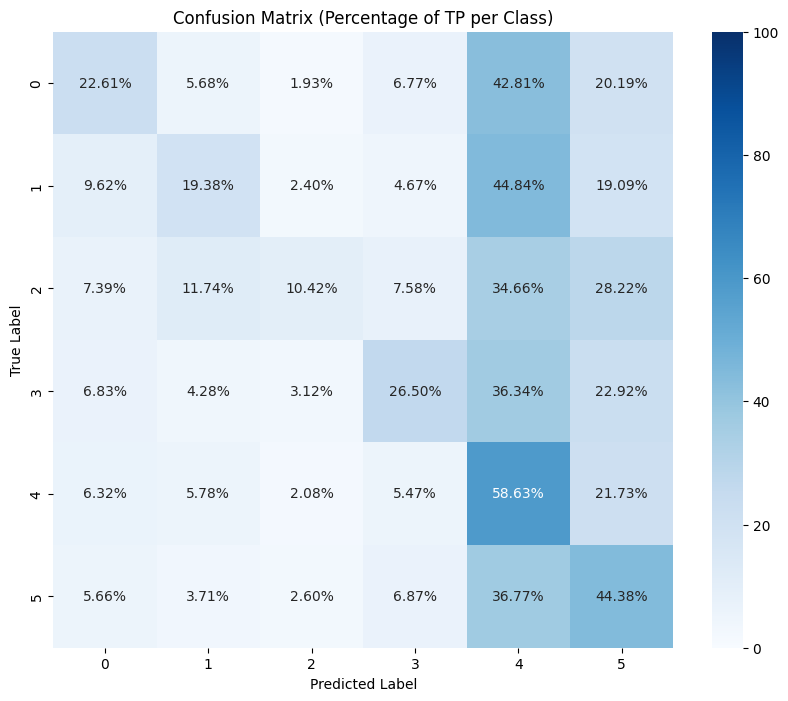

In [75]:
confusion_matrix_plot(y_class_test, etc.predict(X_test_scaled))

In [76]:
def objective_etc_class(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500, step=50),
        'max_depth': trial.suggest_int('max_depth', 5, 30),
        'min_samples_split': trial.suggest_float('min_samples_split', 0.01, 0.5, log=True),
        'min_samples_leaf': trial.suggest_float('min_samples_leaf', 0.01, 0.5, log=True),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),
        'min_weight_fraction_leaf': trial.suggest_float('min_weight_fraction_leaf', 0.0, 0.2),
    }
    etc_optuna = ExtraTreesClassifier(**params)

    score = cross_val_score(etc_optuna, X_train_scaled, y_class_train, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [77]:
study_etc = optuna.create_study(direction='maximize')
study_etc.optimize(objective_etc_class, n_trials=50, n_jobs=-1)

[I 2024-02-22 22:18:10,859] A new study created in memory with name: no-name-5ac3ddfb-e206-47f7-9db6-cb876d14ee0b
[I 2024-02-22 22:18:14,373] Trial 0 finished with value: 0.24735191809619886 and parameters: {'n_estimators': 200, 'max_depth': 9, 'min_samples_split': 0.014269902811635577, 'min_samples_leaf': 0.09164893537146414, 'max_features': 'log2', 'min_weight_fraction_leaf': 0.0012487658228228504}. Best is trial 0 with value: 0.24735191809619886.
[I 2024-02-22 22:18:20,637] Trial 2 finished with value: 0.247190138540702 and parameters: {'n_estimators': 150, 'max_depth': 25, 'min_samples_split': 0.04682155681974344, 'min_samples_leaf': 0.010568262802001514, 'max_features': 'log2', 'min_weight_fraction_leaf': 0.16632134160841489}. Best is trial 0 with value: 0.24735191809619886.
[I 2024-02-22 22:18:22,558] Trial 1 finished with value: 0.24985850418145725 and parameters: {'n_estimators': 500, 'max_depth': 12, 'min_samples_split': 0.010955467748337113, 'min_samples_leaf': 0.107363766064

In [78]:
print('Best trial:')
trial = study_etc.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.2761384145211289
Params: 
  n_estimators: 300
  max_depth: 18
  min_samples_split: 0.08318420512619268
  min_samples_leaf: 0.023974887963697036
  max_features: sqrt
  min_weight_fraction_leaf: 0.028271819752212594


In [79]:
trials_df = study_etc.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_max_depth,params_max_features,params_min_samples_leaf,params_min_samples_split,params_min_weight_fraction_leaf,params_n_estimators,state
39,39,0.276138,2024-02-22 22:18:38.183187,2024-02-22 22:19:05.392949,0 days 00:00:27.209762,18,sqrt,0.023975,0.083184,0.028272,300,COMPLETE
41,41,0.276138,2024-02-22 22:18:40.579129,2024-02-22 22:19:07.926634,0 days 00:00:27.347505,17,sqrt,0.025737,0.100049,0.021438,300,COMPLETE
46,46,0.275168,2024-02-22 22:18:48.318172,2024-02-22 22:19:15.946093,0 days 00:00:27.627921,16,sqrt,0.015791,0.104051,0.025165,300,COMPLETE
43,43,0.274844,2024-02-22 22:18:42.205145,2024-02-22 22:19:10.711913,0 days 00:00:28.506768,30,sqrt,0.027674,0.105016,0.023988,200,COMPLETE
34,34,0.274764,2024-02-22 22:18:34.337038,2024-02-22 22:18:54.938660,0 days 00:00:20.601622,16,sqrt,0.026135,0.098401,0.010791,250,COMPLETE


In [80]:
fig = plot_optimization_history(study_etc)
fig.update_layout(yaxis_range=[0, 1], title="Extra Tree Optuna's Performance", width=930, height=550)
fig.show()

In [81]:
fig = plot_param_importances(study_etc)
fig.update_layout(title="Extra Tree Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

In [82]:
fig = plot_rank(study_etc)
fig.update_layout(title="Extra Tree Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [83]:
etc_class = ExtraTreesClassifier()
etc_class.fit(X_scaled, y_class)

ExtraTreesClassifier()

In [84]:
etc_class.score(X_rest_scaled, y_class_rest)

0.36204286623753273

In [85]:
classification_reporting(y_class_rest, etc_class.predict(X_rest_scaled))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.40      0.24      0.30     11070
                         CLASS II WORDS RELATING TO SPACE       0.35      0.22      0.27      9400
                       CLASS III WORDS RELATING TO MATTER       0.36      0.12      0.18      7140
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.46      0.29      0.35     11077
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.33      0.59      0.42     17422
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.36      0.46      0.41     14576

                                                 accuracy                           0.36     70685
                                                macro avg       0.38      0.32      0.32     70685
                                             weighted avg       0.37      0.36      0.34     70685



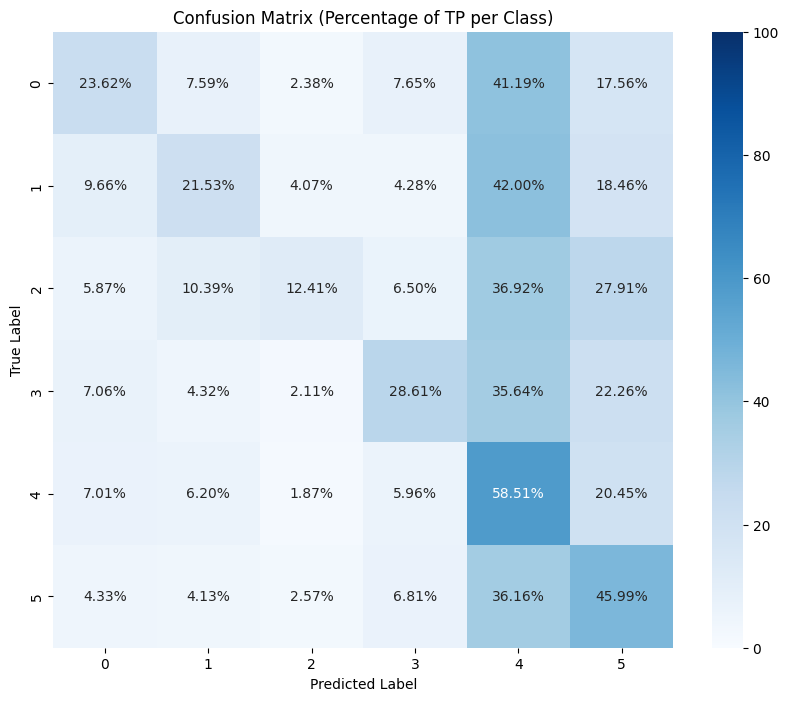

In [86]:
confusion_matrix_plot(y_class_rest, etc_class.predict(X_rest_scaled))

### Bagging Classifier

In [87]:
bgc = BaggingClassifier()
bgc.fit(X_train_scaled, y_class_train)

BaggingClassifier()

In [88]:
bgc.score(X_test_scaled, y_class_test)

0.30880965855498965

In [89]:
classification_reporting(y_class_test, bgc.predict(X_test_scaled))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.27      0.30      0.28       827
                         CLASS II WORDS RELATING TO SPACE       0.26      0.24      0.25       707
                       CLASS III WORDS RELATING TO MATTER       0.27      0.23      0.25       528
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.32      0.28      0.30       864
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.34      0.39      0.36      1298
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.34      0.33      0.33      1077

                                                 accuracy                           0.31      5301
                                                macro avg       0.30      0.29      0.30      5301
                                             weighted avg       0.31      0.31      0.31      5301



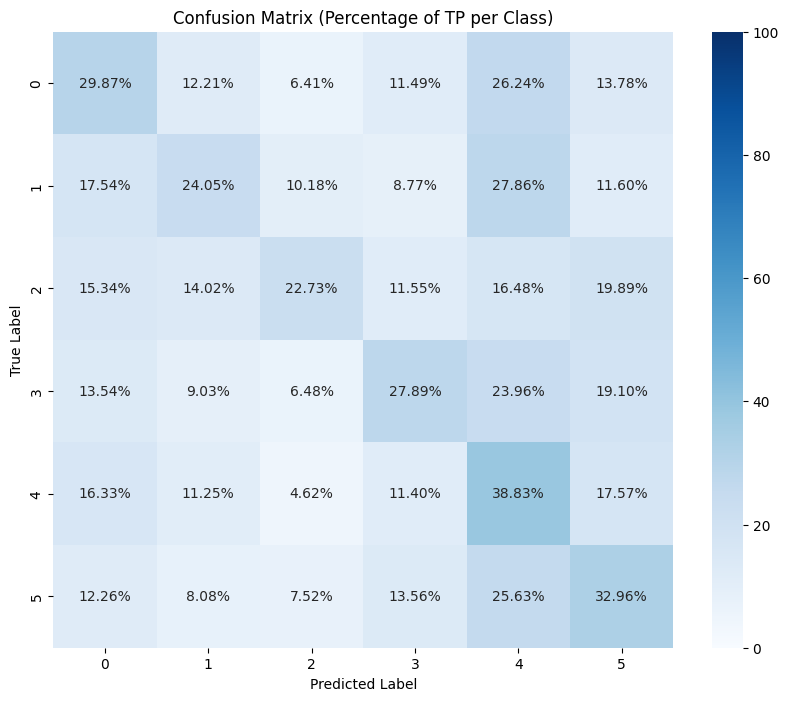

In [90]:
confusion_matrix_plot(y_class_test, bgc.predict(X_test_scaled))

In [91]:
def objective_bgc_class(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 150, step=50)
    max_samples = trial.suggest_float('max_samples', 0.1, 1.0)
    max_features = trial.suggest_float('max_features', 0.1, 1.0)
    bootstrap = trial.suggest_categorical('bootstrap', [True, False])
    bootstrap_features = trial.suggest_categorical('bootstrap_features', [True, False])
        
    bgc = BaggingClassifier(
        n_estimators=n_estimators,
        max_samples=max_samples,
        max_features=max_features,
        bootstrap=bootstrap,
        bootstrap_features=bootstrap_features,
        random_state=33,
        n_jobs=-1
        )

    score = cross_val_score(bgc, X_train_scaled, y_class_train, cv=3, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [92]:
study_bgc = optuna.create_study(direction='maximize')
study_bgc.optimize(objective_bgc_class, n_trials=10, n_jobs=-1)

[I 2024-02-22 22:20:21,097] A new study created in memory with name: no-name-de5c205d-76f2-4284-a973-63e819e41e1e
[I 2024-02-22 22:21:24,051] Trial 2 finished with value: 0.34155506231261895 and parameters: {'n_estimators': 100, 'max_samples': 0.12095573706382197, 'max_features': 0.33827420607584774, 'bootstrap': False, 'bootstrap_features': False}. Best is trial 2 with value: 0.34155506231261895.
[I 2024-02-22 22:22:35,451] Trial 1 finished with value: 0.36007128603936156 and parameters: {'n_estimators': 150, 'max_samples': 0.38552411629757966, 'max_features': 0.3655067843653339, 'bootstrap': True, 'bootstrap_features': True}. Best is trial 1 with value: 0.36007128603936156.
[I 2024-02-22 22:23:19,517] Trial 6 finished with value: 0.335893928683128 and parameters: {'n_estimators': 100, 'max_samples': 0.12002163827395557, 'max_features': 0.33392015006574133, 'bootstrap': True, 'bootstrap_features': True}. Best is trial 1 with value: 0.36007128603936156.
[I 2024-02-22 22:23:21,356] Tria

In [93]:
print('Best trial:')
trial = study_bgc.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.36880416517652304
Params: 
  n_estimators: 100
  max_samples: 0.524239346876338
  max_features: 0.7399084060341942
  bootstrap: False
  bootstrap_features: True


In [94]:
trials_df = study_bgc.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_bootstrap,params_bootstrap_features,params_max_features,params_max_samples,params_n_estimators,state
0,0,0.368804,2024-02-22 22:20:21.097749,2024-02-22 22:23:40.432702,0 days 00:03:19.334953,False,True,0.739908,0.524239,100,COMPLETE
3,3,0.364924,2024-02-22 22:20:21.117819,2024-02-22 22:23:21.356415,0 days 00:03:00.238596,True,False,0.281497,0.966387,150,COMPLETE
1,1,0.360071,2024-02-22 22:20:21.104591,2024-02-22 22:22:35.451816,0 days 00:02:14.347225,True,True,0.365507,0.385524,150,COMPLETE
4,4,0.359748,2024-02-22 22:20:21.123657,2024-02-22 22:23:25.263205,0 days 00:03:04.139548,True,False,0.494770,0.797369,100,COMPLETE
7,7,0.347377,2024-02-22 22:20:21.137679,2024-02-22 22:23:40.640121,0 days 00:03:19.502442,True,True,0.786147,0.968674,50,COMPLETE


In [95]:
fig = plot_optimization_history(study_bgc)
fig.update_layout(yaxis_range=[0, 1], title="Bagging Classifier Optuna's Performance", width=930, height=550)
fig.show()

In [96]:
fig = plot_param_importances(study_bgc)
fig.update_layout(title="Bagging Classifier Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

In [97]:
fig = plot_rank(study_bgc)
fig.update_layout(title="Bagging Classifier Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [98]:
bgc_class = BaggingClassifier(**study_bgc.best_trial.params, random_state=33, n_jobs=-1)
bgc_class.fit(X_scaled, y_class)

BaggingClassifier(bootstrap=False, bootstrap_features=True,
                  max_features=0.7399084060341942,
                  max_samples=0.524239346876338, n_estimators=100, n_jobs=-1,
                  random_state=33)

In [99]:
bgc_class.score(X_rest_scaled, y_class_rest)

0.38108509584777533

In [100]:
classification_reporting(y_class_rest, bgc_class.predict(X_rest_scaled))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.41      0.27      0.33     11070
                         CLASS II WORDS RELATING TO SPACE       0.37      0.26      0.31      9400
                       CLASS III WORDS RELATING TO MATTER       0.37      0.18      0.24      7140
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.46      0.33      0.38     11077
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.36      0.56      0.44     17422
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.38      0.46      0.41     14576

                                                 accuracy                           0.38     70685
                                                macro avg       0.39      0.34      0.35     70685
                                             weighted avg       0.39      0.38      0.37     70685



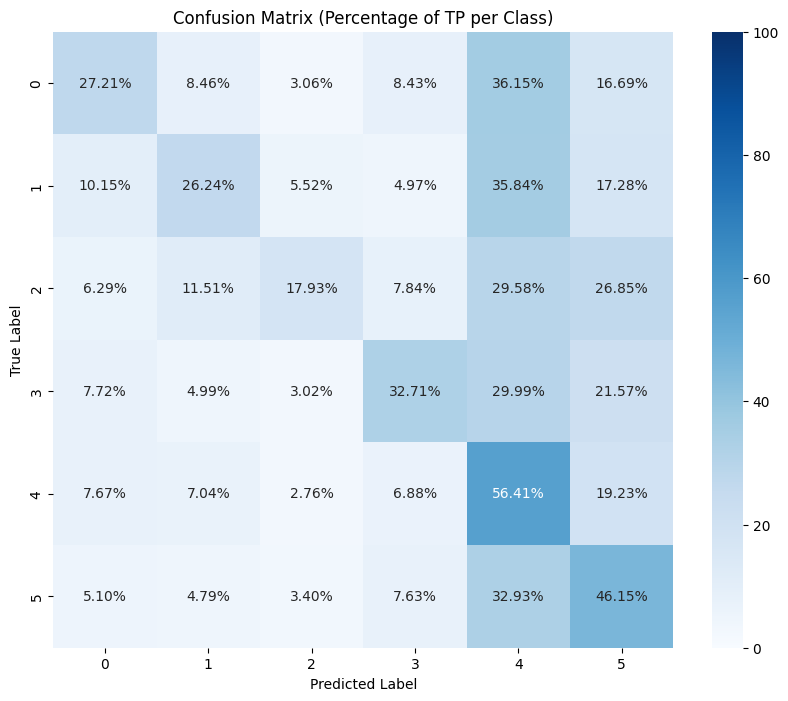

In [101]:
confusion_matrix_plot(y_class_rest, bgc_class.predict(X_rest_scaled))

### XGBoost

In [102]:
# Initialize the label encoder
label_encoder = LabelEncoder()

# Fit the encoder to the class labels and transform them to numeric labels
y_class_encoded = label_encoder.fit_transform(y_class)
y_class_train_encoded = label_encoder.fit_transform(y_class_train)
y_class_test_encoded = label_encoder.fit_transform(y_class_test)
y_class_rest_encoded = label_encoder.fit_transform(y_class_rest)

In [103]:
xgboost = XGBClassifier(use_label_encoder=False, n_jobs=-1, random_state=33)
xgboost.fit(X_train_scaled, y_class_train_encoded)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [104]:
xgboost.score(X_test_scaled, y_class_test_encoded)

0.37596679871722316

In [105]:
classification_reporting(y_class_test_encoded, xgboost.predict(X_test_scaled))

              precision    recall  f1-score   support

           0       0.39      0.33      0.36       827
           1       0.34      0.27      0.30       707
           2       0.36      0.23      0.28       528
           3       0.44      0.34      0.38       864
           4       0.37      0.51      0.43      1298
           5       0.37      0.42      0.39      1077

    accuracy                           0.38      5301
   macro avg       0.38      0.35      0.36      5301
weighted avg       0.38      0.38      0.37      5301



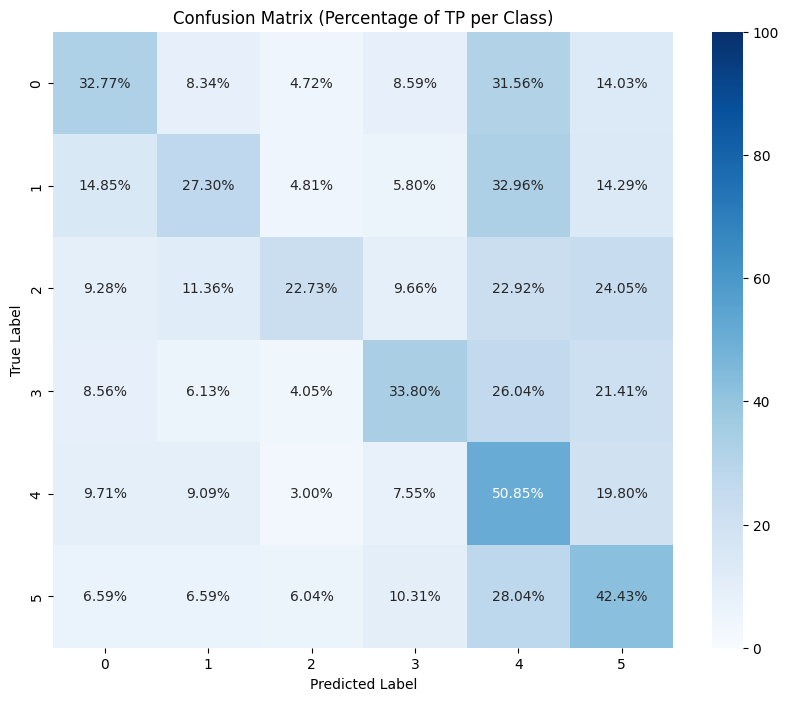

In [106]:
confusion_matrix_plot(y_class_test_encoded, xgboost.predict(X_test_scaled))

In [107]:
def objective_xgb_class(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 250, step=50),
        'max_depth': trial.suggest_int('max_depth', 3, 5),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.05),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'lambda': trial.suggest_float('lambda', 0, 10),
        'alpha': trial.suggest_float('alpha', 0, 10),
        'objective': 'multi:softmax',
        'num_class': 6,
        'eval_metric': 'mlogloss',
        'use_label_encoder': False,
    }
    
    xgboost = XGBClassifier(**params, n_jobs=-1, random_state=33)
    score = cross_val_score(xgboost, X_train_scaled, y_class_train_encoded, cv=3, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [108]:
study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(objective_xgb_class, n_trials=20, n_jobs=-1)

[I 2024-02-22 22:24:48,532] A new study created in memory with name: no-name-ea6db9d5-783b-4a63-9d55-6ff973195821
[I 2024-02-22 22:25:07,204] Trial 3 finished with value: 0.36929013146567874 and parameters: {'n_estimators': 50, 'max_depth': 4, 'learning_rate': 0.036106234845214656, 'min_child_weight': 7, 'gamma': 6.303775243035722, 'subsample': 0.8908070834741137, 'colsample_bytree': 0.8973284876951584, 'lambda': 6.53982489521916, 'alpha': 9.193143545799087}. Best is trial 3 with value: 0.36929013146567874.
[I 2024-02-22 22:25:20,639] Trial 2 finished with value: 0.3728475098312214 and parameters: {'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.034729527207489376, 'min_child_weight': 7, 'gamma': 9.50133878876111, 'subsample': 0.9990956467660643, 'colsample_bytree': 0.6763258874401643, 'lambda': 1.2951281252955171, 'alpha': 9.593308765721883}. Best is trial 2 with value: 0.3728475098312214.
[I 2024-02-22 22:26:04,660] Trial 0 finished with value: 0.37042187569689594 and paramet

In [109]:
print('Best trial:')
trial = study_xgb.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.39864230311735893
Params: 
  n_estimators: 200
  max_depth: 4
  learning_rate: 0.04822590473824782
  min_child_weight: 2
  gamma: 2.1915621738210382
  subsample: 0.5751672472178365
  colsample_bytree: 0.984259616926004
  lambda: 5.017337377910094
  alpha: 6.606362375043875


In [110]:
trials_df = study_xgb.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_alpha,params_colsample_bytree,params_gamma,params_lambda,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_subsample,state
12,12,0.398642,2024-02-22 22:24:48.551643,2024-02-22 22:28:15.796536,0 days 00:03:27.244893,6.606362,0.984260,2.191562,5.017337,0.048226,4,2,200,0.575167,COMPLETE
8,8,0.397672,2024-02-22 22:24:48.551643,2024-02-22 22:27:08.368814,0 days 00:02:19.817171,5.079841,0.902964,3.949452,4.361147,0.025823,5,5,250,0.786023,COMPLETE
16,16,0.397106,2024-02-22 22:25:07.204005,2024-02-22 22:28:30.346348,0 days 00:03:23.142343,6.127664,0.906672,0.582794,7.799996,0.030303,5,5,150,0.872822,COMPLETE
1,1,0.396378,2024-02-22 22:24:48.536015,2024-02-22 22:26:47.597845,0 days 00:01:59.061830,4.238613,0.833801,0.382607,3.813297,0.021051,4,1,250,0.547618,COMPLETE
9,9,0.395893,2024-02-22 22:24:48.551643,2024-02-22 22:28:28.004219,0 days 00:03:39.452576,7.543656,0.778102,1.665351,3.476786,0.018703,5,6,250,0.764671,COMPLETE


In [111]:
fig = plot_optimization_history(study_xgb)
fig.update_layout(yaxis_range=[0, 1], title="XGBoost Optuna's Performance", width=930, height=550)
fig.show()

In [112]:
fig = plot_param_importances(study_xgb)
fig.update_layout(title="XGBoost Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

In [113]:
fig = plot_rank(study_xgb)
fig.update_layout(title="XGBoost Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [114]:
xgboost_class = XGBClassifier(**study_xgb.best_trial.params, n_jobs=-1, random_state=33)
xgboost_class.fit(X_scaled, y_class_encoded)

XGBClassifier(alpha=6.606362375043875, base_score=None, booster=None,
              callbacks=None, colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.984259616926004, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=2.1915621738210382,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=5.017337377910094,
              learning_rate=0.04822590473824782, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=-1, ...)

In [115]:
xgboost_class.score(X_rest_scaled, y_class_rest_encoded)

0.41322770036075546

In [116]:
classification_reporting(y_class_rest_encoded, xgboost_class.predict(X_rest_scaled))

              precision    recall  f1-score   support

           0       0.43      0.32      0.37     11070
           1       0.38      0.33      0.36      9400
           2       0.41      0.26      0.32      7140
           3       0.48      0.38      0.43     11077
           4       0.40      0.54      0.46     17422
           5       0.41      0.48      0.44     14576

    accuracy                           0.41     70685
   macro avg       0.42      0.39      0.39     70685
weighted avg       0.42      0.41      0.41     70685



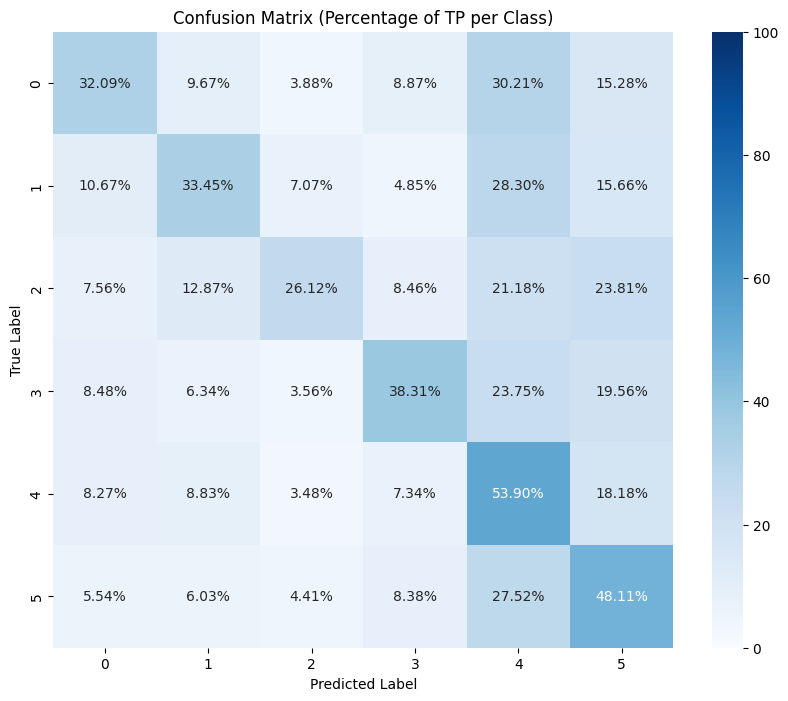

In [117]:
confusion_matrix_plot(y_class_rest_encoded, xgboost_class.predict(X_rest_scaled))

### LightGBM

In [118]:
lgbm = LGBMClassifier()
lgbm.fit(X_train_scaled, y_class_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 130560
[LightGBM] [Info] Number of data points in the train set: 12367, number of used features: 512
[LightGBM] [Info] Start training from score -1.852344
[LightGBM] [Info] Start training from score -2.018508
[LightGBM] [Info] Start training from score -2.287100
[LightGBM] [Info] Start training from score -1.870550
[LightGBM] [Info] Start training from score -1.397598
[LightGBM] [Info] Start training from score -1.572683


LGBMClassifier()

In [119]:
lgbm.score(X_test_scaled, y_class_test)

0.3904923599320883

In [120]:
classification_reporting(y_class_test, lgbm.predict(X_test_scaled))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.41      0.34      0.37       827
                         CLASS II WORDS RELATING TO SPACE       0.36      0.30      0.32       707
                       CLASS III WORDS RELATING TO MATTER       0.39      0.26      0.31       528
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.45      0.36      0.40       864
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.38      0.52      0.44      1298
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.37      0.43      0.40      1077

                                                 accuracy                           0.39      5301
                                                macro avg       0.39      0.37      0.37      5301
                                             weighted avg       0.39      0.39      0.39      5301



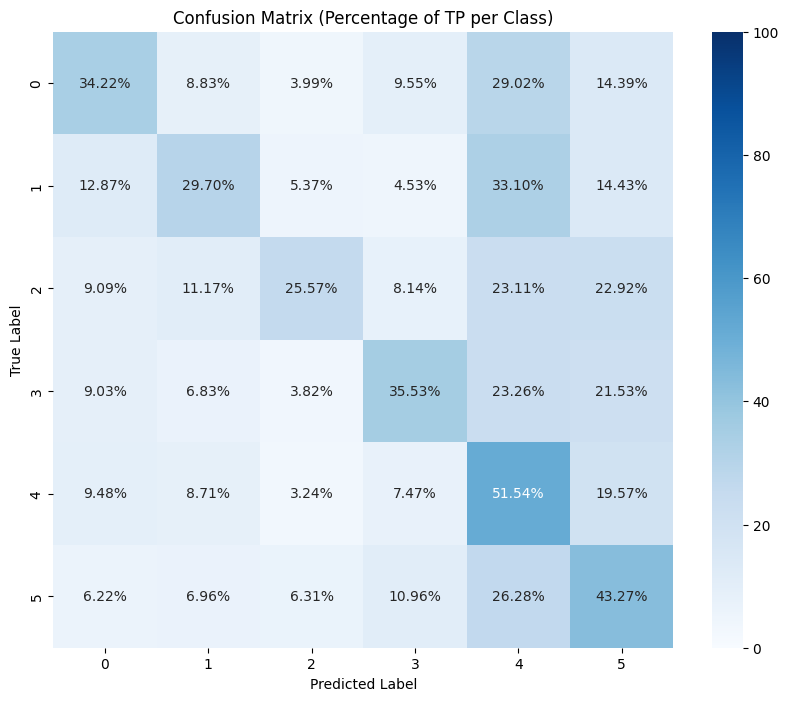

In [121]:
confusion_matrix_plot(y_class_test, lgbm.predict(X_test_scaled))

In [122]:
def objective_lgbm_class(trial):
    params = {
        'objective': 'multiclass',
        'metric': 'multi_logloss',  # Use multi_logloss for multiclass classification
        'num_class': 6,  # Adjust based on your dataset
        'n_estimators': trial.suggest_int('n_estimators', 50, 250, step=50),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.05),
        'max_depth': trial.suggest_int('max_depth', 3, 6),  # -1 means no limit
        'num_leaves': trial.suggest_int('num_leaves', 20, 300),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 25),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),  # Bagging fraction
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),  # Feature fraction
        # 'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 10.0),  # L1 regularization
        # 'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 10.0),  # L2 regularization
        'n_jobs': -1
    }
    
    # Create and fit the model
    lgbm = LGBMClassifier(**params)
    score = cross_val_score(lgbm, X_train_scaled, y_class_train, cv=3, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [123]:
study_lgbm = optuna.create_study(direction='maximize')
study_lgbm.optimize(objective_lgbm_class, n_trials=30, n_jobs=-1)

[I 2024-02-22 22:28:50,605] A new study created in memory with name: no-name-d64104f3-c305-4df0-b7ad-81937c7c4443
[I 2024-02-22 22:29:20,617] Trial 1 finished with value: 0.39556942002060297 and parameters: {'n_estimators': 150, 'learning_rate': 0.04989072616343797, 'max_depth': 3, 'num_leaves': 251, 'min_child_samples': 25, 'subsample': 0.61315233300187, 'colsample_bytree': 0.9020565690840838}. Best is trial 1 with value: 0.39556942002060297.
[I 2024-02-22 22:30:15,141] Trial 7 finished with value: 0.39435694619152634 and parameters: {'n_estimators': 150, 'learning_rate': 0.022679905327461482, 'max_depth': 5, 'num_leaves': 133, 'min_child_samples': 18, 'subsample': 0.7162506280441001, 'colsample_bytree': 0.7276957752999624}. Best is trial 1 with value: 0.39556942002060297.
[I 2024-02-22 22:30:28,492] Trial 0 finished with value: 0.38546211751852283 and parameters: {'n_estimators': 100, 'learning_rate': 0.0160029775803715, 'max_depth': 6, 'num_leaves': 192, 'min_child_samples': 11, 'su

In [124]:
print('Best trial:')
trial = study_lgbm.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.39969341581874107
Params: 
  n_estimators: 250
  learning_rate: 0.037156886197252555
  max_depth: 3
  num_leaves: 267
  min_child_samples: 11
  subsample: 0.6870223897880209
  colsample_bytree: 0.5569263394546724


In [125]:
trials_df = study_lgbm.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_colsample_bytree,params_learning_rate,params_max_depth,params_min_child_samples,params_n_estimators,params_num_leaves,params_subsample,state
5,5,0.399693,2024-02-22 22:28:50.631328,2024-02-22 22:31:12.798015,0 days 00:02:22.166687,0.556926,0.037157,3,11,250,267,0.687022,COMPLETE
13,13,0.397187,2024-02-22 22:28:50.686269,2024-02-22 22:31:32.266702,0 days 00:02:41.580433,0.811246,0.049754,4,5,100,222,0.715027,COMPLETE
24,24,0.396378,2024-02-22 22:31:22.788913,2024-02-22 22:32:22.100140,0 days 00:00:59.311227,0.608211,0.046021,3,10,150,28,0.827005,COMPLETE
8,8,0.396136,2024-02-22 22:28:50.658894,2024-02-22 22:30:53.227643,0 days 00:02:02.568749,0.904406,0.043062,3,11,150,184,0.850860,COMPLETE
12,12,0.395812,2024-02-22 22:28:50.679683,2024-02-22 22:31:56.936048,0 days 00:03:06.256365,0.641203,0.016696,4,22,250,53,0.627917,COMPLETE


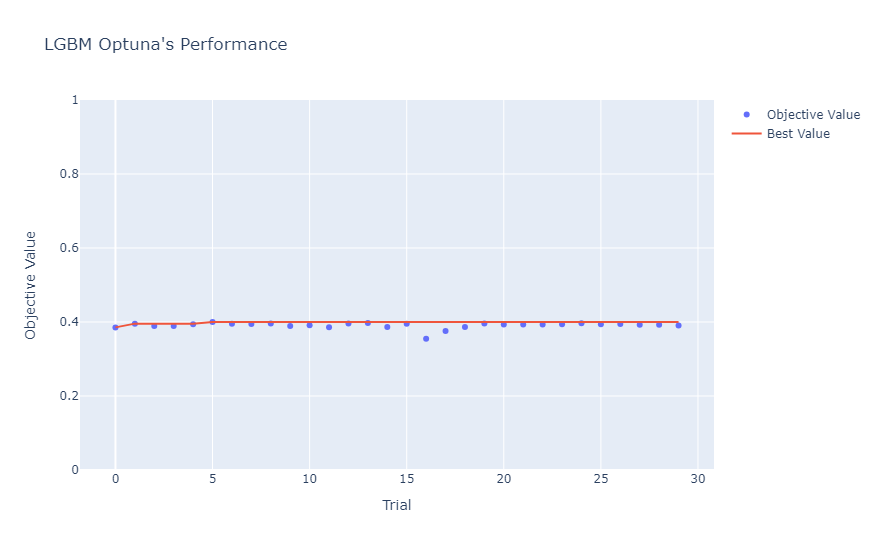

In [126]:
fig = plot_optimization_history(study_lgbm)
fig.update_layout(yaxis_range=[0, 1], title="LGBM Optuna's Performance", width=930, height=550)
fig.show()

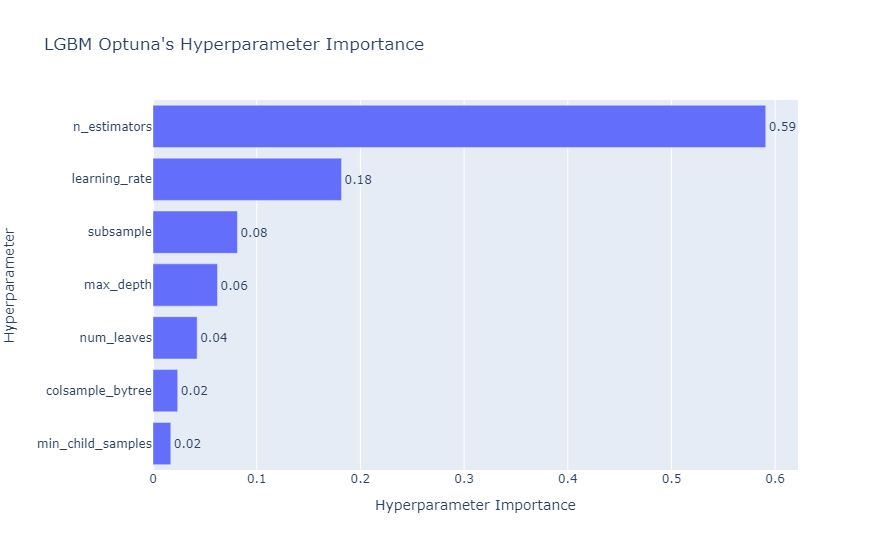

In [127]:
fig = plot_param_importances(study_lgbm)
fig.update_layout(title="LGBM Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

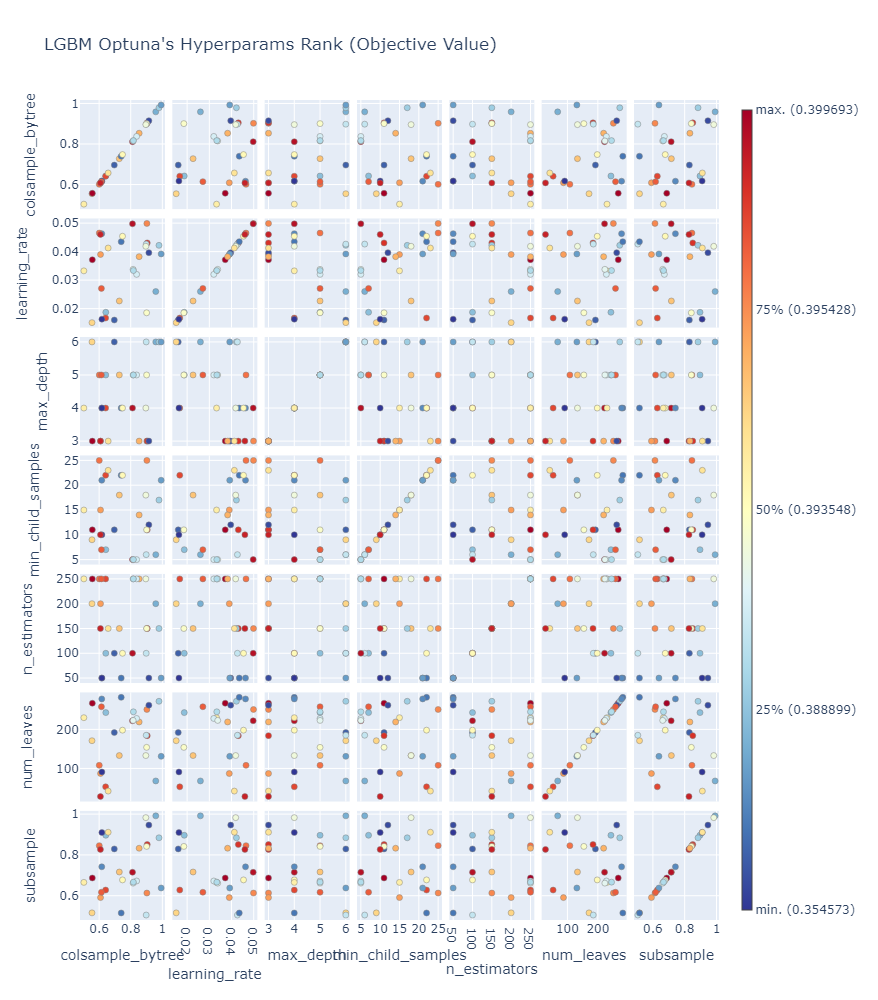

In [128]:
fig = plot_rank(study_lgbm)
fig.update_layout(title="LGBM Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [129]:
lgbm_class = LGBMClassifier(**study_lgbm.best_trial.params)
lgbm_class.fit(X_scaled, y_class)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 130560
[LightGBM] [Info] Number of data points in the train set: 17668, number of used features: 512
[LightGBM] [Info] Start training from score -1.853991
[LightGBM] [Info] Start training from score -2.017340
[LightGBM] [Info] Start training from score -2.292897
[LightGBM] [Info] Start training from score -1.853269
[LightGBM] [Info] Start training from score -1.400430
[LightGBM] [Info] Start training from score -1.578948
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

LGBMClassifier(colsample_bytree=0.5569263394546724,
               learning_rate=0.037156886197252555, max_depth=3,
               min_child_samples=11, n_estimators=250, num_leaves=267,
               subsample=0.6870223897880209)

In [130]:
lgbm_class.score(X_rest_scaled, y_class_rest)

0.4118129730494447

In [131]:
classification_reporting(y_class_rest, lgbm_class.predict(X_rest_scaled))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.43      0.32      0.37     11070
                         CLASS II WORDS RELATING TO SPACE       0.38      0.34      0.36      9400
                       CLASS III WORDS RELATING TO MATTER       0.40      0.26      0.32      7140
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.49      0.38      0.43     11077
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.40      0.54      0.46     17422
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.40      0.48      0.44     14576

                                                 accuracy                           0.41     70685
                                                macro avg       0.42      0.39      0.39     70685
                                             weighted avg       0.42      0.41      0.41     70685



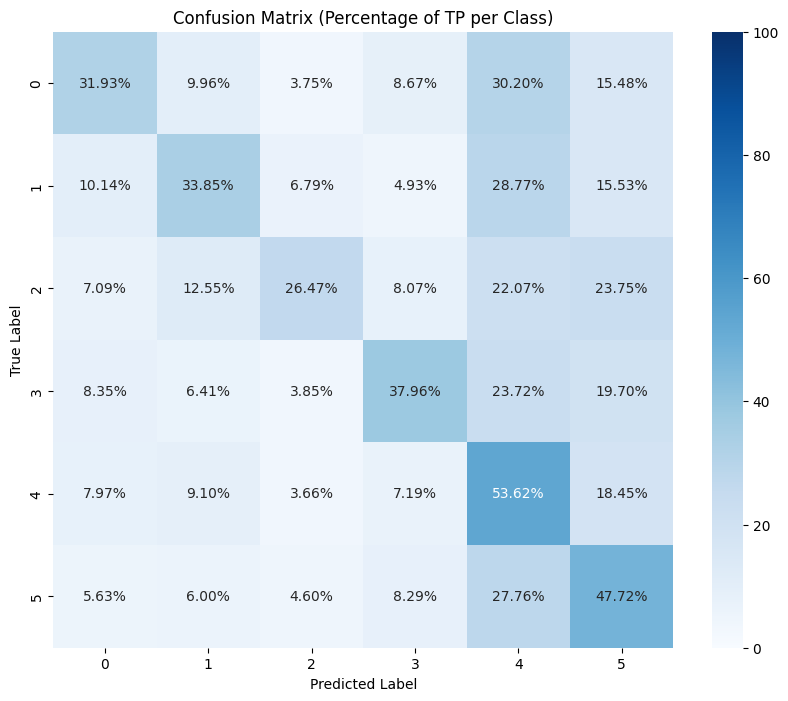

In [132]:
confusion_matrix_plot(y_class_rest, lgbm_class.predict(X_rest_scaled))

## 5. Results

> The range of scores of the model is between 24% to 43%. Its was not as we thought it could be but the best models so far where the 2 best known models the LightGBM and the XGBoost that both hitted 41.18% and 41.32%. Also the same notebook had run with both model's embeddings and with PCA on top and we present only best combination wich is the use model and without pca before.

In [133]:
lgbm_class = LGBMClassifier(**study_lgbm.best_trial.params)
lgbm_class.fit(pd.DataFrame(list(use_embeddings.Embeddings.values)), use_embeddings.Class)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 130560
[LightGBM] [Info] Number of data points in the train set: 88353, number of used features: 512
[LightGBM] [Info] Start training from score -1.853994
[LightGBM] [Info] Start training from score -2.017487
[LightGBM] [Info] Start training from score -2.292596
[LightGBM] [Info] Start training from score -1.853344
[LightGBM] [Info] Start training from score -1.400486
[LightGBM] [Info] Start training from score -1.578875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

LGBMClassifier(colsample_bytree=0.5569263394546724,
               learning_rate=0.037156886197252555, max_depth=3,
               min_child_samples=11, n_estimators=250, num_leaves=267,
               subsample=0.6870223897880209)

In [134]:
dump(lgbm_class, 'Models/lgbm_class_model.joblib')

['Models/lgbm_class_model.joblib']

In [135]:
xgboost_class = XGBClassifier(**study_xgb.best_trial.params)
xgboost_class.fit(pd.DataFrame(list(use_embeddings.Embeddings.values)), label_encoder.fit_transform(use_embeddings.Class))

XGBClassifier(alpha=6.606362375043875, base_score=None, booster=None,
              callbacks=None, colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.984259616926004, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=2.1915621738210382,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=5.017337377910094,
              learning_rate=0.04822590473824782, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None, ...)

In [136]:
dump(xgboost_class, 'Models/xgboost_class_model.joblib')

['Models/xgboost_class_model.joblib']

**How to further improve the predictions**

the models didn't even hit a 50% accuracy in the prediction part but there are more unexplored paths that could lead to even higher scores. Some of them are the following:

1. Try use neural networks
2. Use a different model for embeddings
3. Use sentences with the meaning of the word as inputs in the models could lead to better embeddings
4. Train for longer with optuna
5. Dimensionality reduction without PCA